# Лабораторна робота №5
## Баштового Івана
## Варіант № 14
# Тема :
## Використання технологiї передачi знань для побудови моделi згорткових нейронних мереж в задачi класифiкацiї кольорових зображень

# Мета роботи:
## • Навчитися використовувати технологiю передачi знань (transfer learning) для побудови моделi згорткових нейронних мереж з метою класифiкацiї кольорових зображень.

## • Навчитися створювати моделi згорткових нейронних мереж за допомогою бiблiотеки TensorFlow та API Keras.
 
## • Використати згорткову нейронну мережу для класифiкацiї кольорових зобра-жень.

## • Для представлення результатiв використати TensorBoard.

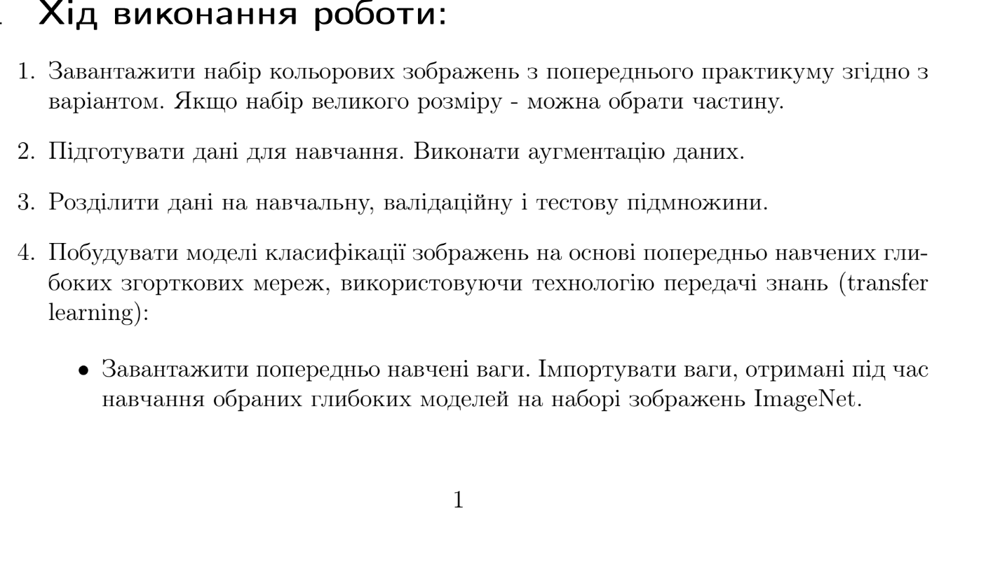
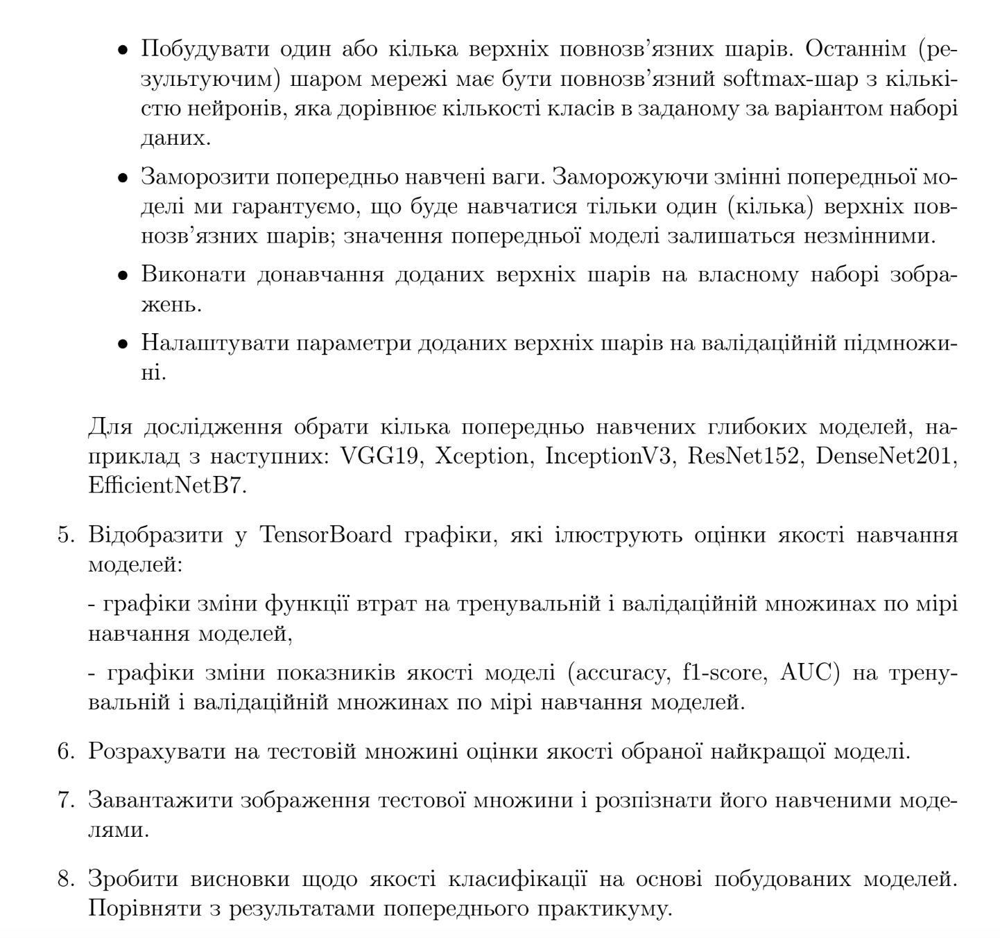

### Варіант 14 -  5 Flower Types Classification Dataset, kaggle.com

## Load Libraries

In [120]:
import numpy as np
import pandas as pd
import os
import itertools
from PIL import Image
import matplotlib.pyplot as plt 
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import f1_score, roc_auc_score


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,Dropout, BatchNormalization, GlobalAveragePooling2D

from tensorflow.keras.callbacks import EarlyStopping, TensorBoard, ReduceLROnPlateau




import warnings
warnings.filterwarnings("ignore")


## Data Preprocessing


In [47]:
data_dir = "flower_images"

filepaths = []
labels = []

# List subdirectories (folds) excluding any non-directory files
folds = [fold for fold in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, fold))]

for fold in folds:
    foldpaths = os.path.join(data_dir, fold)
    filelists = os.listdir(foldpaths)
    
    for file in filelists:
        if file != '.DS_Store':  # Skip .DS_Store files
            filepath= os.path.join(foldpaths, file)
        
            filepaths.append(filepath)
            labels.append(fold)
        
Fseries = pd.Series(filepaths, name='Filepath')
Lseries = pd.Series(labels, name='Label')

df = pd.concat([Fseries, Lseries], axis=1)
df.head()

,Filepath,Label
0,flower_images/Lotus/16905dde87.jpg,Lotus
1,flower_images/Lotus/839f7d1a14.jpg,Lotus
2,flower_images/Lotus/6acf5327ad.jpg,Lotus
3,flower_images/Lotus/327793cdf0.jpg,Lotus
4,flower_images/Lotus/c8e4698aa0.jpg,Lotus


<Axes: xlabel='Label', ylabel='Count'>

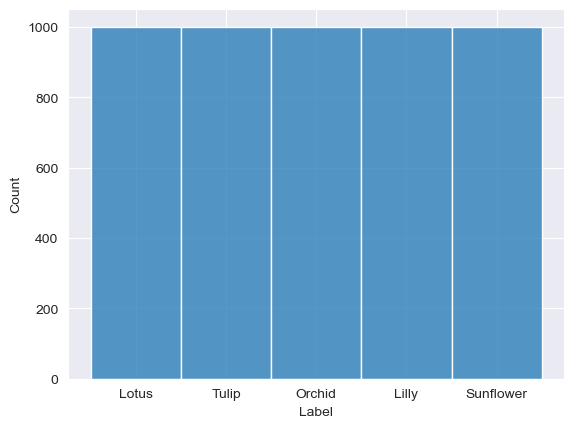

In [48]:
sns.histplot(df["Label"])

In [49]:
# Function to reduce the number of samples by half while keeping class balance
def reduce_samples_by_half(df):
    unique_labels = df['Label'].unique()
    reduced_df = pd.DataFrame(columns=['Filepath', 'Label'])

    for label in unique_labels:
        temp_df = df[df['Label'] == label]
        reduced_temp_df = temp_df.sample(frac=0.5)
        reduced_df = pd.concat([reduced_df, reduced_temp_df], axis=0)

    return reduced_df.reset_index(drop=True)


In [50]:
reduced_df = reduce_samples_by_half(df)
reduced_df.head()

,Filepath,Label
0,flower_images/Lotus/8705237f75.jpg,Lotus
1,flower_images/Lotus/c21186d2ff.jpg,Lotus
2,flower_images/Lotus/c529a947b0.jpg,Lotus
3,flower_images/Lotus/4f808e8733.jpg,Lotus
4,flower_images/Lotus/2c6f4d3ddf.jpg,Lotus


<Axes: xlabel='Label', ylabel='Count'>

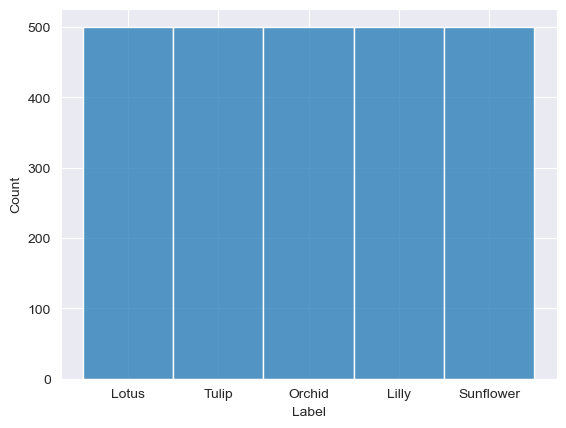

In [51]:
sns.histplot(reduced_df["Label"])

## Split data into train, valid & test


In [52]:
train_df, dummy_df = train_test_split(df, test_size=0.2, shuffle= True, random_state= 42,
                                     stratify= df['Label'])

valid_df, test_df = train_test_split(dummy_df, test_size=0.5, shuffle= True, random_state= 42,
                                    stratify= dummy_df['Label'])

In [53]:
print(f"Train shape = {train_df.shape}")
print(f"Valid shape = {valid_df.shape}")
print(f"Test shape = {test_df.shape}")

Train shape = (4000, 2)
Valid shape = (500, 2)
Test shape = (500, 2)


## Create image data generator


In [108]:

batch_size = 16
image_size = (224, 224)

train_generator_obj = ImageDataGenerator(
    rescale=1.0/255
)

# Only rescaling for validation and test data
validation_generator_obj = ImageDataGenerator(rescale=1.0/255)
test_generator_obj = ImageDataGenerator(rescale=1.0/255)

# Flow from DataFrame
train_generator = train_generator_obj.flow_from_dataframe(
    train_df, 
    x_col='Filepath', 
    y_col='Label',
    class_mode='categorical', 
    color_mode='rgb',
    batch_size=batch_size, 
    target_size=image_size
)

validation_generator = validation_generator_obj.flow_from_dataframe(
    valid_df, 
    x_col='Filepath', 
    y_col='Label',
    class_mode='categorical', 
    color_mode='rgb',
    batch_size=batch_size, 
    target_size=image_size
)

test_generator = test_generator_obj.flow_from_dataframe(
    test_df, 
    x_col='Filepath', 
    y_col='Label',
    class_mode='categorical', 
    color_mode='rgb',
    batch_size=batch_size, 
    target_size=image_size
)


Found 4000 validated image filenames belonging to 5 classes.
Found 500 validated image filenames belonging to 5 classes.
Found 500 validated image filenames belonging to 5 classes.


#### Show sample from training data

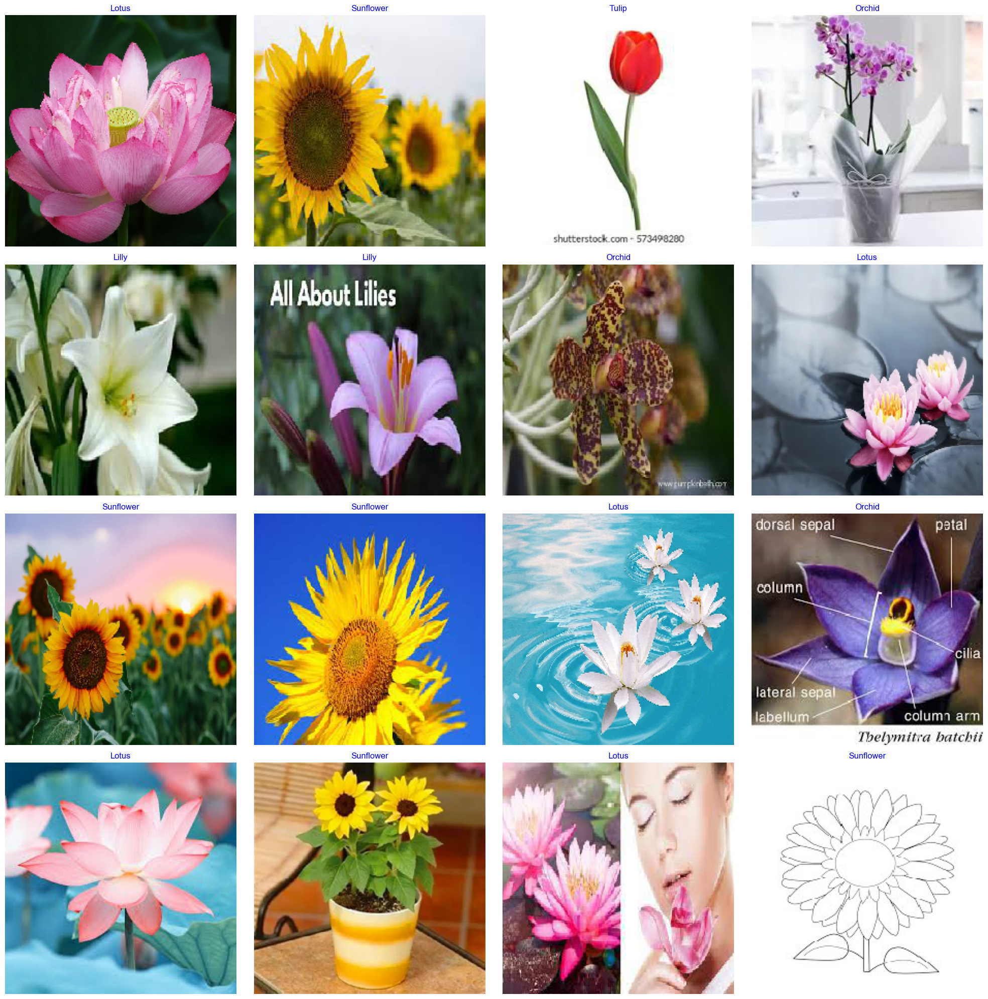

In [105]:
gen_dict = train_generator.class_indices
classes_name = list(gen_dict.keys())

images, labels = next(train_generator)

plt.figure(figsize=(20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] 
    plt.imshow(image)
    index = np.argmax(labels[i])  
    class_name = classes_name[index] 
    plt.title(class_name, color='blue', fontsize=12)
    plt.axis('off')

plt.tight_layout()
plt.show()

## Data Augmentration

In [115]:

# Data augmentation for training data
train_generator_augmentation_strict = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=40,
    width_shift_range=0.3,
    height_shift_range=0.3,
    shear_range=0.3,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator_augmentation_weak = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=20,  # Reduced from 40
    width_shift_range=0.1,  # Reduced from 0.3
    height_shift_range=0.1,  # Reduced from 0.3
    shear_range=0.1,  # Reduced from 0.3
    zoom_range=0.1,  # Reduced from 0.3
    horizontal_flip=True,  # Same
    fill_mode='nearest'  # Same
)



# Flow from DataFrame
train_generator_augmented_strict = train_generator_augmentation_strict.flow_from_dataframe(
    train_df, 
    x_col='Filepath', 
    y_col='Label',
    class_mode='categorical', 
    color_mode='rgb',
    batch_size=batch_size, 
    target_size=image_size
)

# Flow from DataFrame
train_generator_augmented_weak = train_generator_augmentation_weak.flow_from_dataframe(
    train_df, 
    x_col='Filepath', 
    y_col='Label',
    class_mode='categorical', 
    color_mode='rgb',
    batch_size=batch_size, 
    target_size=image_size
)

Found 4000 validated image filenames belonging to 5 classes.
Found 4000 validated image filenames belonging to 5 classes.


#### Compare augmentations

In [116]:
def compare_generators(train_df, indices, generators, titles, batch_size=16):
    """
    Compare images from different generators.

    Parameters:
        train_df (DataFrame): DataFrame containing the file paths and labels.
        indices (list): List of indices of the images in the batch to compare.
        generators (list): List of image data generators.
        titles (list): List of titles for each subplot.
        batch_size (int): Size of the batch for generators.

    Returns:
        None: This function will plot the images.
    """
    
    if len(generators) != len(titles):
        raise ValueError("Number of generators must match the number of titles.")
    
    num_examples = len(indices)
    
    # Create subplots
    fig, axes = plt.subplots(num_examples, len(generators), figsize=(15, 5 * num_examples))
    
    if num_examples == 1:
        axes = np.expand_dims(axes, 0)  # Ensure axes is always 2D
    if len(generators) == 1:
        axes = np.expand_dims(axes, 1)  # Ensure axes is always 2D
    
    # Generate a batch from each generator
    batches = [gen.flow_from_dataframe(
        train_df, 
        x_col='Filepath', 
        y_col='Label',
        class_mode='categorical', 
        color_mode='rgb',
        batch_size=batch_size, 
        target_size=image_size,
        shuffle=False
    ) for gen in generators]
    
    # Get images and labels from the batch
    for row, index in enumerate(indices):
        for col, (batch, title) in enumerate(zip(batches, titles)):
            images, labels = next(batch)
            axes[row, col].imshow(images[index])
            if row == 0:  # Only set title for the top row
                axes[row, col].set_title(title)
            axes[row, col].axis('off')
    
    plt.show()


Found 4000 validated image filenames belonging to 5 classes.
Found 4000 validated image filenames belonging to 5 classes.
Found 4000 validated image filenames belonging to 5 classes.


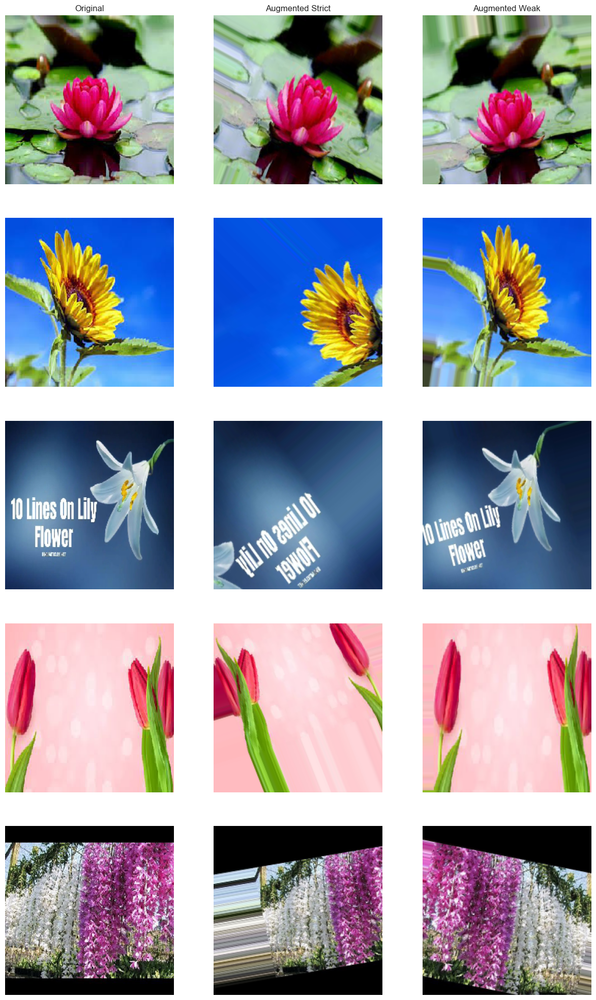

In [117]:
# Define generators
generators = [
    train_generator_obj,
    train_generator_augmentation_strict,
    train_generator_augmentation_weak
]

# Define titles
titles = ['Original', 'Augmented Strict', 'Augmented Weak']

# Compare images from different generators
compare_generators(train_df, indices=[0, 1, 2, 3, 4], generators=generators, titles=titles, batch_size=batch_size)

## Metrics

In [134]:
from keras import backend as K

def recall(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1(y_true, y_pred):
    precision_m = precision(y_true, y_pred)
    recall_m = recall(y_true, y_pred)
    return 2*((precision_m*recall_m)/(precision_m+recall_m+K.epsilon()))

def auc(y_true, y_pred):
    pos = K.sum(y_true, axis=0)
    neg = K.sum(1 - y_true, axis=0)
    
    tp = K.sum(y_true * y_pred, axis=0)
    fp = K.sum((1 - y_true) * y_pred, axis=0)
    
    tpr = tp / (pos + K.epsilon())
    fpr = fp / (neg + K.epsilon())
    
    auc = (1 - fpr + tpr) / 2
    
    return K.mean(auc)

In [142]:

ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length % n == 0 and ts_length / n <= 80]))
test_steps = ts_length // test_batch_size

def evaluate_model(model, training_generator, valid_generator=validation_generator, test_generator=test_generator, test_steps=test_steps):
    """
    Evaluate the model on training, validation, and test datasets.

    Parameters:
        model: The trained model to evaluate.
        train_generator: The data generator for the training dataset.
        valid_generator: The data generator for the validation dataset.
        test_generator: The data generator for the test dataset.
        test_df: DataFrame containing the test data.

    Returns:
        None: This function prints the evaluation results.
    """

    
    train_score = model.evaluate(training_generator, steps=test_steps, verbose=1)
    valid_score = model.evaluate(valid_generator, steps=test_steps, verbose=1)
    test_score = model.evaluate(test_generator, steps=test_steps, verbose=1)
    
    print("Train Loss: ", train_score[0])
    print("Train Accuracy: ", train_score[1])
    print('-' * 20)
    print("Valid Loss: ", valid_score[0])
    print("Valid Accuracy: ", valid_score[1])
    print('-' * 20)
    print("Test Loss: ", test_score[0])
    print("Test Accuracy: ", test_score[1])

In [150]:
def show_predictions(model, test_generator, class_indices, num_images=5):
    class_labels = {v: k for k, v in class_indices.items()}
    
    test_images, test_labels = next(test_generator)
    
    predictions = model.predict(test_images)
    predicted_labels = np.argmax(predictions, axis=1)
    
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(test_images[i])
        true_label = class_labels[np.argmax(test_labels[i])]
        predicted_label = class_labels[predicted_labels[i]]
        plt.title(f"True: {true_label}\nPred: {predicted_label}")
        plt.axis('off')
    plt.show()

# Transfer Learning

## VGG

In [135]:

base_model_vgg = tf.keras.applications.VGG19(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)
)

base_model_vgg.trainable = False


vgg = Sequential([
    
    base_model_vgg,
    GlobalAveragePooling2D(),
    BatchNormalization(),

    Dense(256, activation='relu'
        #   ,kernel_regularizer=tf.keras.regularizers.l2(0.01)
           ),
    BatchNormalization(),

    Dropout(0.5),
    Dense(5, activation='softmax')  
])


adam_opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7, decay=0.0, amsgrad=False)
vgg.compile(optimizer=adam_opt, 
              loss='categorical_crossentropy', 
              metrics=['accuracy', f1, auc])


early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)
tensorboard_callback = TensorBoard(log_dir="./vgg_logs")

vgg.summary()



Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 7, 7, 512)         20024384  
                                                                 
 global_average_pooling2d_2  (None, 512)               0         
 2 (GlobalAveragePooling2D)                                      
                                                                 
 batch_normalization_313 (B  (None, 512)               2048      
 atchNormalization)                                              
                                                                 
 dense_56 (Dense)            (None, 256)               131328    
                                                                 
 batch_normalization_314 (B  (None, 256)               1024      
 atchNormalization)                                              
                                                     

In [136]:
history_vgg = vgg.fit(
    train_generator_augmented_weak,
    epochs=10, 
    validation_data=validation_generator,
    callbacks=[early_stopping, reduce_lr, tensorboard_callback]
)


Epoch 1/10


2024-05-19 16:51:33.851483: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - ETA: 0s - loss: 1.1047 - accuracy: 0.6300 - f1: 0.6232 - auc: 0.7396

2024-05-19 16:52:45.311300: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - 82s 318ms/step - loss: 1.1047 - accuracy: 0.6300 - f1: 0.6232 - auc: 0.7396 - val_loss: 0.8653 - val_accuracy: 0.7140 - val_f1: 0.6088 - val_auc: 0.6729 - lr: 0.0010
Epoch 2/10
250/250 [==============================] - 76s 302ms/step - loss: 0.8288 - accuracy: 0.7128 - f1: 0.6999 - auc: 0.7787 - val_loss: 0.6481 - val_accuracy: 0.7780 - val_f1: 0.7468 - val_auc: 0.7624 - lr: 0.0010
Epoch 3/10
250/250 [==============================] - 78s 310ms/step - loss: 0.7150 - accuracy: 0.7343 - f1: 0.7316 - auc: 0.7884 - val_loss: 0.6298 - val_accuracy: 0.7760 - val_f1: 0.7622 - val_auc: 0.7975 - lr: 0.0010
Epoch 4/10
250/250 [==============================] - 79s 315ms/step - loss: 0.6774 - accuracy: 0.7575 - f1: 0.7472 - auc: 0.7936 - val_loss: 0.5880 - val_accuracy: 0.7900 - val_f1: 0.7849 - val_auc: 0.7986 - lr: 0.0010
Epoch 5/10
250/250 [==============================] - 82s 328ms/step - loss: 0.6285 - accuracy: 0.7795 - f1: 0.7734 - auc: 0.8090 -

#### Epoch - Loss
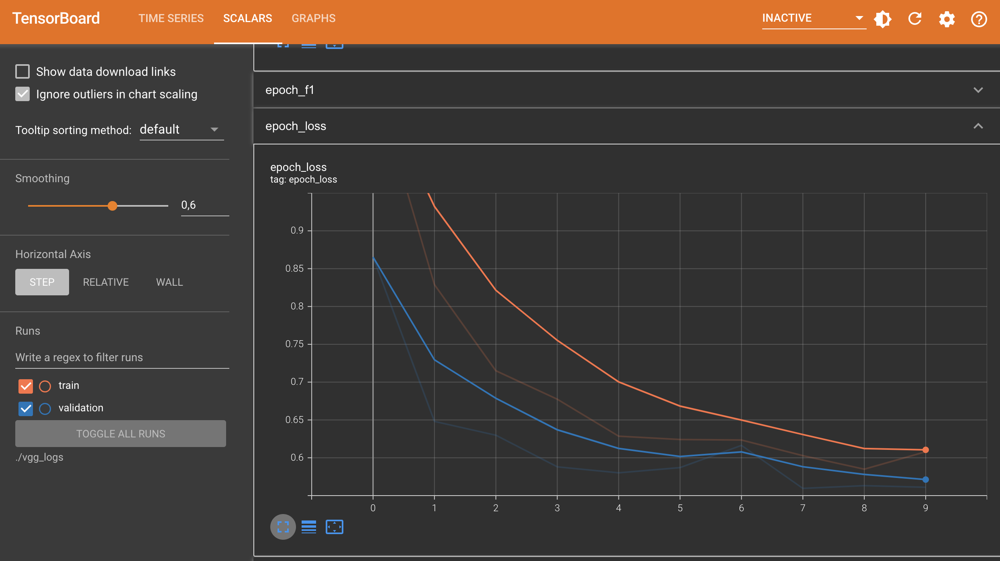

#### Epoch - Accuracy
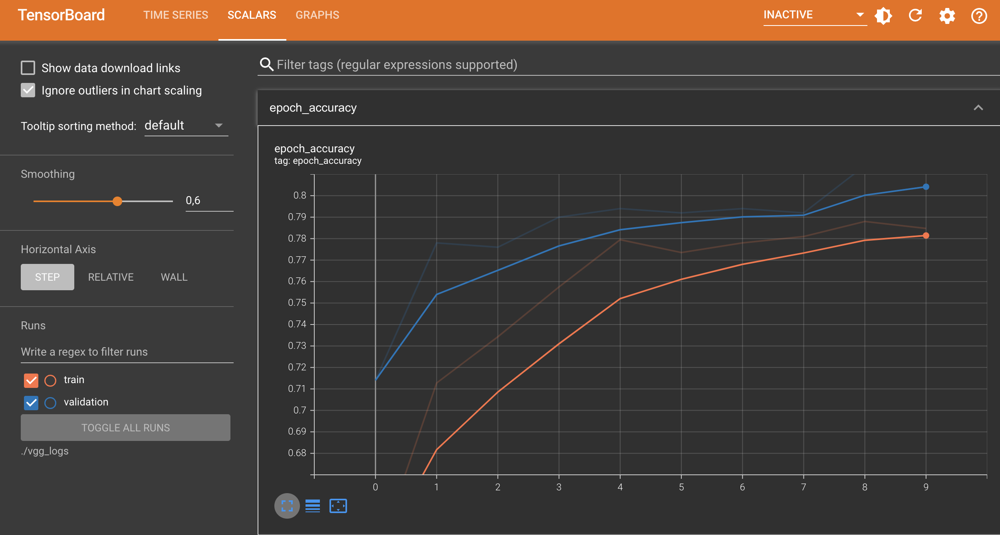

#### Epoch - F1 
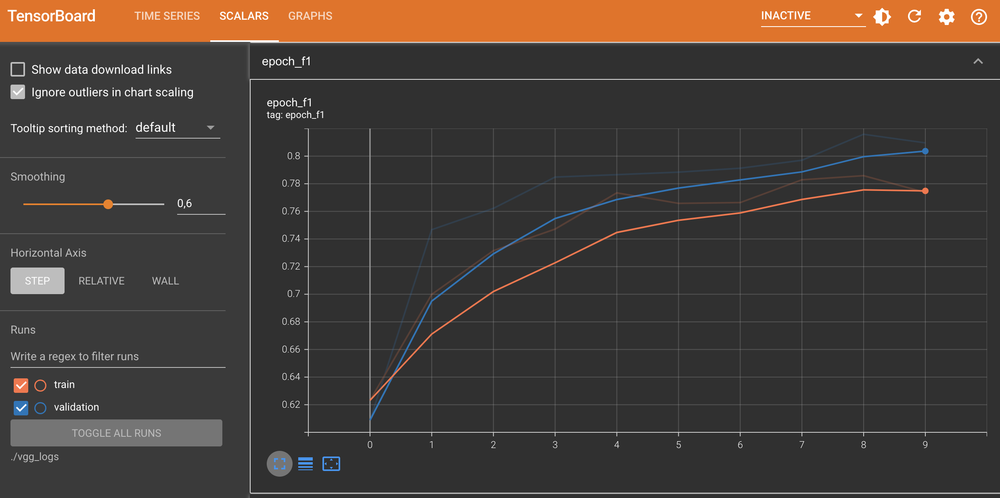

#### Epoch - AUC
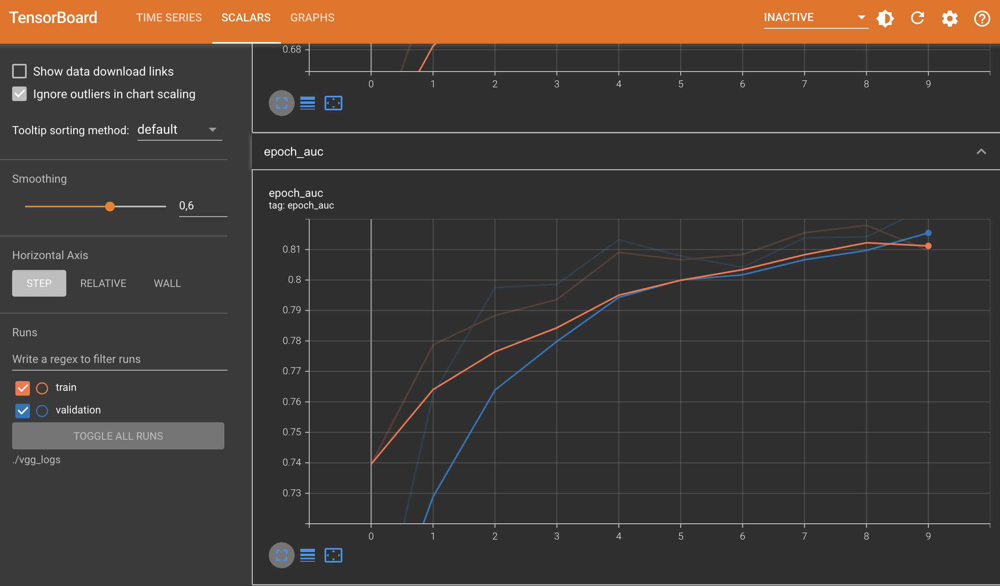

#### Test set evaluation

In [145]:
evaluate_model(vgg, train_generator_augmented_weak)

10/10 [==============================] - 3s 289ms/step - loss: 0.5063 - accuracy: 0.8438 - f1: 0.8439 - auc: 0.8341
Train Loss:  0.6386886239051819
Train Accuracy:  0.8062500357627869
--------------------
Valid Loss:  0.4446357190608978
Valid Accuracy:  0.831250011920929
--------------------
Test Loss:  0.5062864422798157
Test Accuracy:  0.84375


1/1 [==============================] - 0s 19ms/step


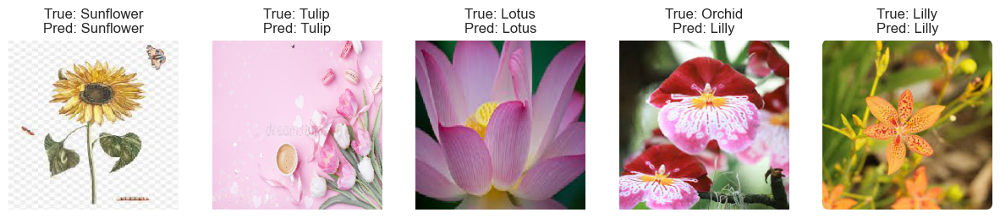

In [166]:
show_predictions(vgg, test_generator, test_generator.class_indices)

## Inception

In [148]:
inception_base = tf.keras.applications.InceptionV3(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3))

inception_base.trainable = False

inception = Sequential([
    
    inception_base,
    GlobalAveragePooling2D(),
    BatchNormalization(),

    Dense(256, activation='relu'
        #   ,kernel_regularizer=tf.keras.regularizers.l2(0.01)
           ),
    BatchNormalization(),

    Dropout(0.5),
    Dense(5, activation='softmax')  
])


adam_opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7, decay=0.0, amsgrad=False)
inception.compile(optimizer=adam_opt, 
              loss='categorical_crossentropy', 
              metrics=['accuracy', f1, auc])


early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)
tensorboard_callback = TensorBoard(log_dir="./inception_logs")

inception.summary()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d_2  (None, 2048)              0         
 4 (GlobalAveragePooling2D)                                      
                                                                 
 batch_normalization_505 (B  (None, 2048)              8192      
 atchNormalization)                                              
                                                                 
 dense_60 (Dense)            (None, 256)               524544    
                                                                 
 batch_normalization_506 (B  (None, 256)               1024      
 atchNormalization)                                              
                                                     

In [149]:
history_inception = inception.fit(
    train_generator_augmented_weak,
    epochs=10, 
    validation_data=validation_generator,
    callbacks=[early_stopping, reduce_lr, tensorboard_callback]
)


Epoch 1/10


2024-05-19 17:19:53.627154: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - ETA: 0s - loss: 0.9661 - accuracy: 0.7095 - f1: 0.7076 - auc: 0.7920

2024-05-19 17:20:39.257197: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - 63s 221ms/step - loss: 0.9661 - accuracy: 0.7095 - f1: 0.7076 - auc: 0.7920 - val_loss: 0.5296 - val_accuracy: 0.8320 - val_f1: 0.8171 - val_auc: 0.8315 - lr: 0.0010
Epoch 2/10
250/250 [==============================] - 38s 152ms/step - loss: 0.6465 - accuracy: 0.7733 - f1: 0.7696 - auc: 0.8282 - val_loss: 0.4760 - val_accuracy: 0.8500 - val_f1: 0.8556 - val_auc: 0.8516 - lr: 0.0010
Epoch 3/10
250/250 [==============================] - 37s 149ms/step - loss: 0.5411 - accuracy: 0.8105 - f1: 0.8062 - auc: 0.8458 - val_loss: 0.4421 - val_accuracy: 0.8560 - val_f1: 0.8645 - val_auc: 0.8514 - lr: 0.0010
Epoch 4/10
250/250 [==============================] - 37s 147ms/step - loss: 0.5264 - accuracy: 0.8098 - f1: 0.8061 - auc: 0.8463 - val_loss: 0.4663 - val_accuracy: 0.8640 - val_f1: 0.8591 - val_auc: 0.8593 - lr: 0.0010
Epoch 5/10
250/250 [==============================] - 37s 147ms/step - loss: 0.4894 - accuracy: 0.8280 - f1: 0.8251 - auc: 0.8529 -

#### Epochs - Loss
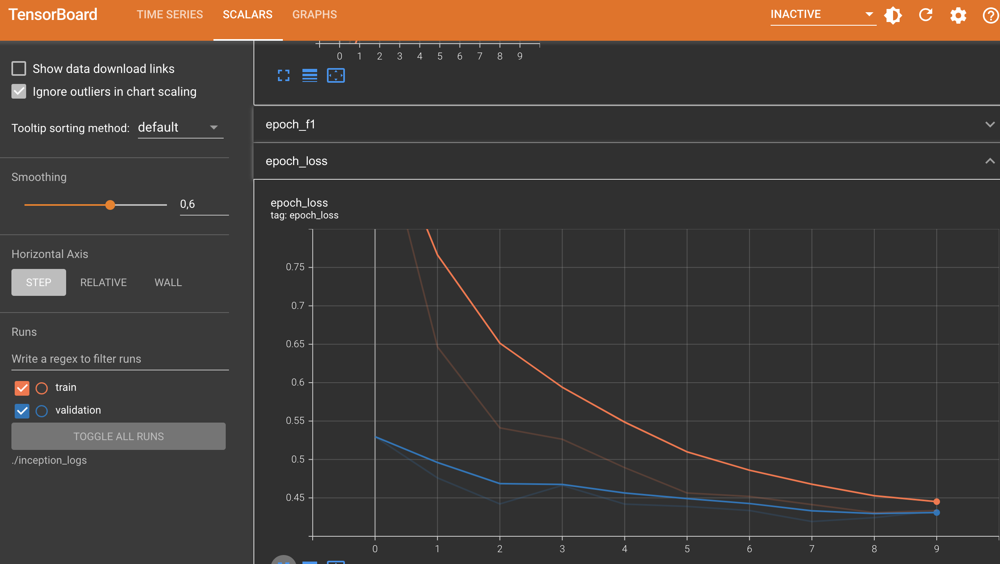

#### Epochs - Accuracy
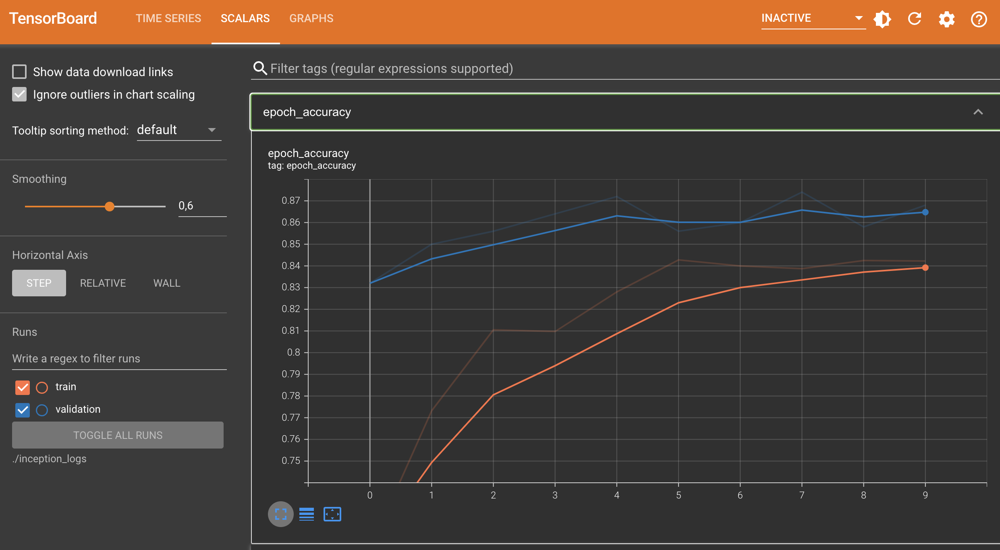

#### Epochs - F1
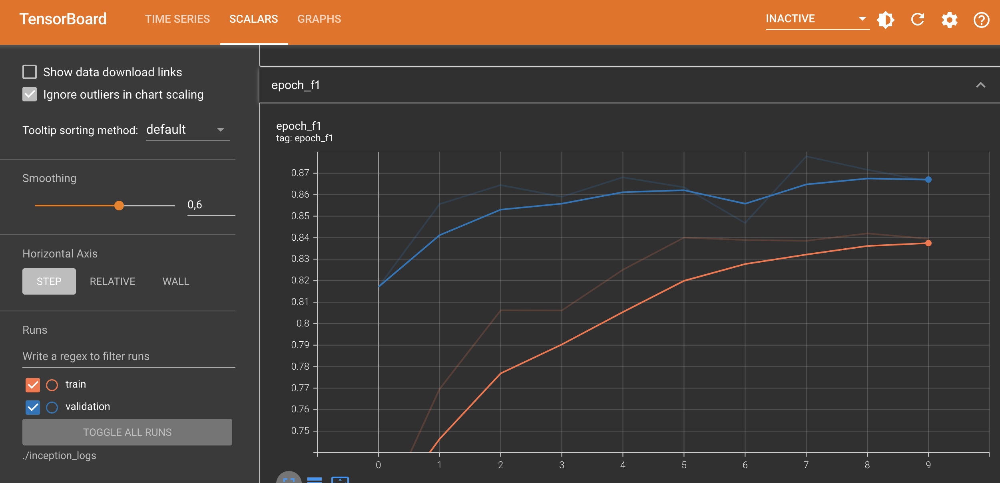

#### Epochs - AUC
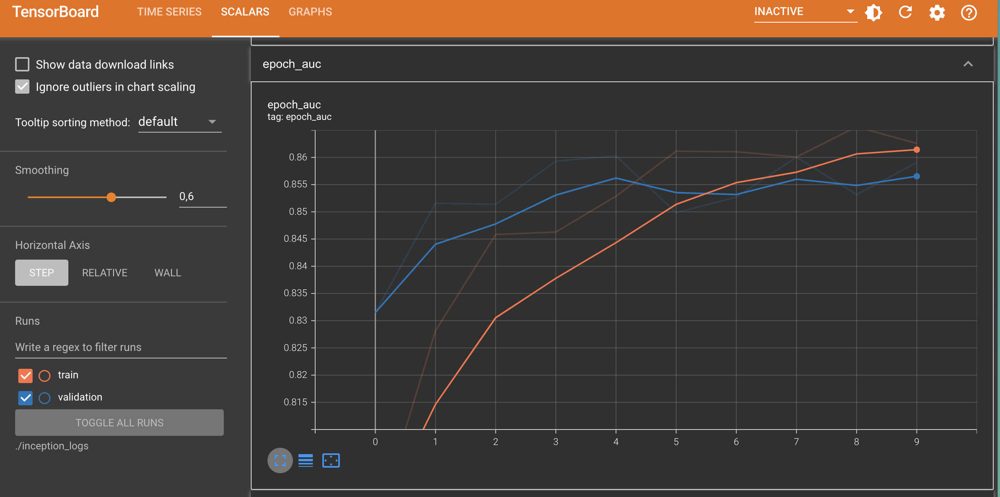

#### Test set evaluation

In [151]:
evaluate_model(inception, train_generator_augmented_weak)

10/10 [==============================] - 1s 96ms/step - loss: 0.3973 - accuracy: 0.8688 - f1: 0.8616 - auc: 0.8479
Train Loss:  0.25570836663246155
Train Accuracy:  0.918749988079071
--------------------
Valid Loss:  0.4891178607940674
Valid Accuracy:  0.84375
--------------------
Test Loss:  0.3973260819911957
Test Accuracy:  0.8687500357627869


2024-05-19 17:30:16.149308: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


1/1 [==============================] - 4s 4s/step


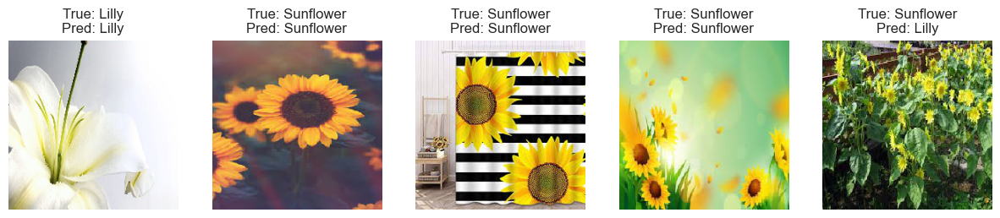

In [153]:
show_predictions(inception, test_generator, test_generator.class_indices)

## DenseNet

In [157]:
base_model_densenet = tf.keras.applications.DenseNet201(
    weights='imagenet',
    include_top=False,
    input_shape=(224, 224, 3)
    )

base_model_densenet.trainable = False

densenet = Sequential([
    
    base_model_densenet, 
    GlobalAveragePooling2D(),
    BatchNormalization(),  

    Dense(256, activation='relu'
        #   , kernel_regularizer=regularizers.l2(0.01)
          ), 
    BatchNormalization(), 

    Dropout(0.5),  
    Dense(5, activation='softmax')  
])


early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
# early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)

tensorboard_callback = TensorBoard(log_dir="./densenet_logs")
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.00001)



adam_opt = Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-7, amsgrad=False)
densenet.compile(optimizer=adam_opt,
                loss='categorical_crossentropy',
                metrics=['accuracy', f1, auc])

densenet.summary()


Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet201 (Functional)    (None, 7, 7, 1920)        18321984  
                                                                 
 global_average_pooling2d_2  (None, 1920)              0         
 7 (GlobalAveragePooling2D)                                      
                                                                 
 batch_normalization_511 (B  (None, 1920)              7680      
 atchNormalization)                                              
                                                                 
 dense_66 (Dense)            (None, 256)               491776    
                                                                 
 batch_normalization_512 (B  (None, 256)               1024      
 atchNormalization)                                              
                                                     

In [158]:
history_densenet = densenet.fit(train_generator_augmented_weak,
                          epochs=10, 
                          validation_data=validation_generator,
                          callbacks=[early_stopping, reduce_lr, tensorboard_callback])

Epoch 1/10


2024-05-19 17:35:02.230488: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - ETA: 0s - loss: 0.7527 - accuracy: 0.7595 - f1: 0.7587 - auc: 0.8318

2024-05-19 17:36:34.273033: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


250/250 [==============================] - 132s 476ms/step - loss: 0.7527 - accuracy: 0.7595 - f1: 0.7587 - auc: 0.8318 - val_loss: 0.4640 - val_accuracy: 0.8440 - val_f1: 0.8511 - val_auc: 0.8588 - lr: 0.0010
Epoch 2/10
250/250 [==============================] - 76s 304ms/step - loss: 0.4632 - accuracy: 0.8403 - f1: 0.8405 - auc: 0.8732 - val_loss: 0.4118 - val_accuracy: 0.8780 - val_f1: 0.8851 - val_auc: 0.8844 - lr: 0.0010
Epoch 3/10
250/250 [==============================] - 80s 319ms/step - loss: 0.3706 - accuracy: 0.8745 - f1: 0.8746 - auc: 0.8928 - val_loss: 0.3812 - val_accuracy: 0.8780 - val_f1: 0.8842 - val_auc: 0.8768 - lr: 0.0010
Epoch 4/10
250/250 [==============================] - 75s 298ms/step - loss: 0.3281 - accuracy: 0.8838 - f1: 0.8819 - auc: 0.8986 - val_loss: 0.3807 - val_accuracy: 0.8900 - val_f1: 0.8901 - val_auc: 0.8910 - lr: 0.0010
Epoch 5/10
250/250 [==============================] - 81s 324ms/step - loss: 0.3185 - accuracy: 0.8898 - f1: 0.8888 - auc: 0.8980 

#### Epochs - Loss
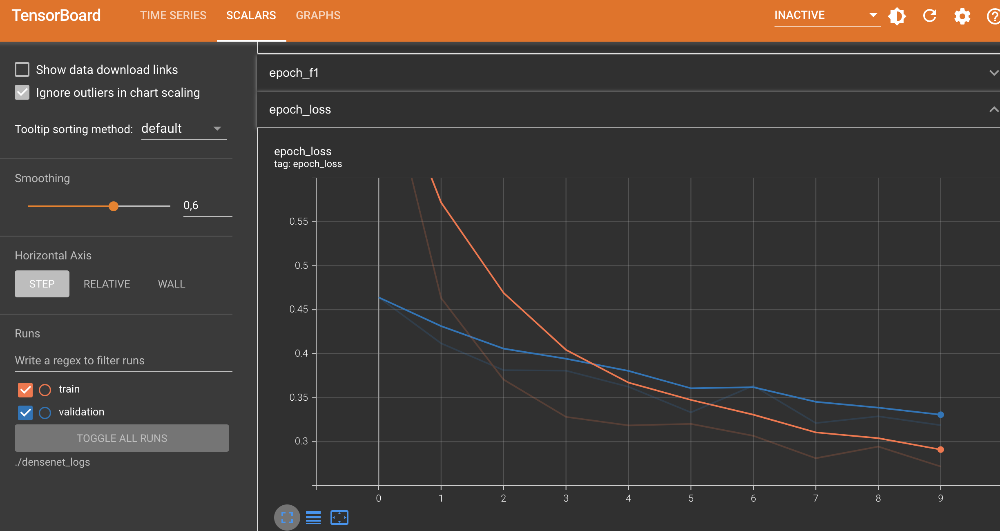

#### Epochs - Accuracy
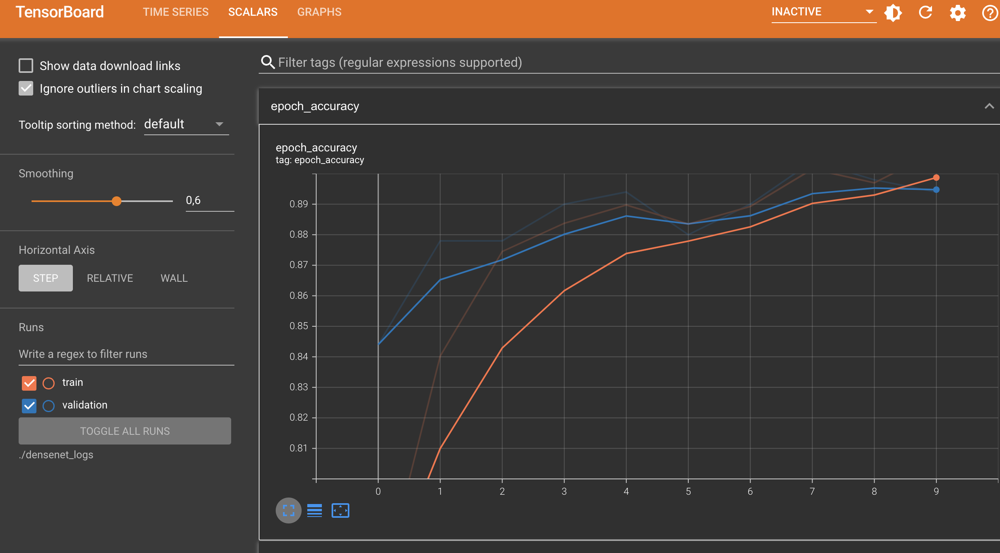
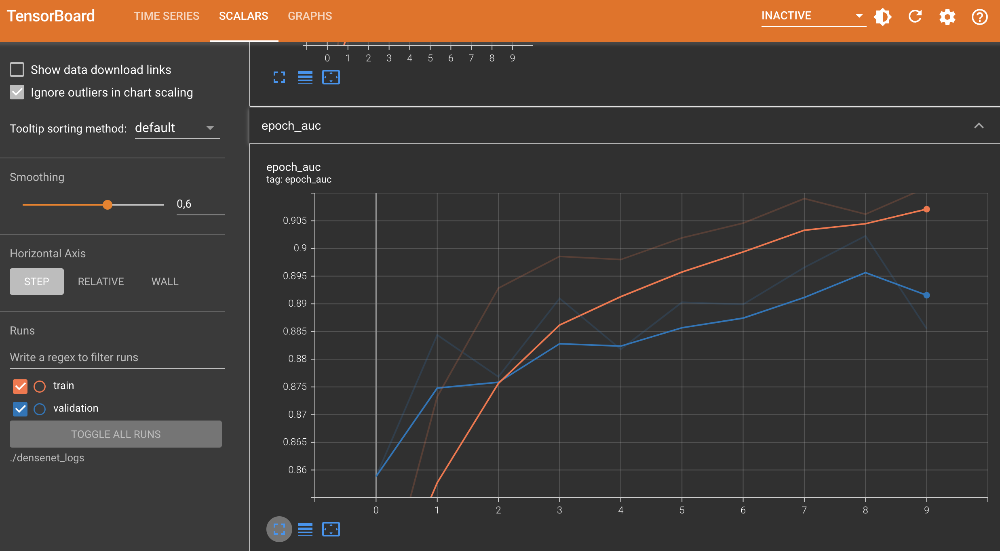

#### Epochs - F1
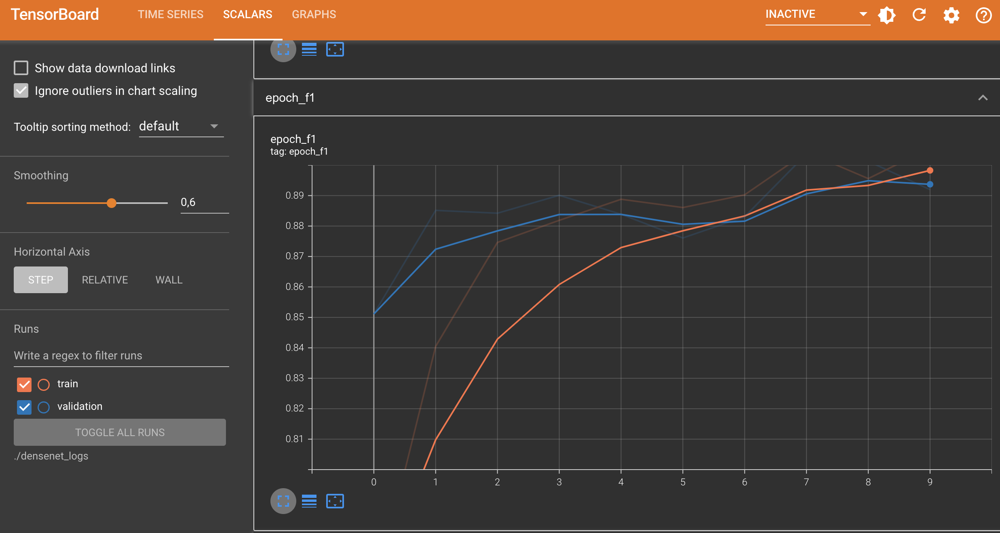

#### Epochs - AUC
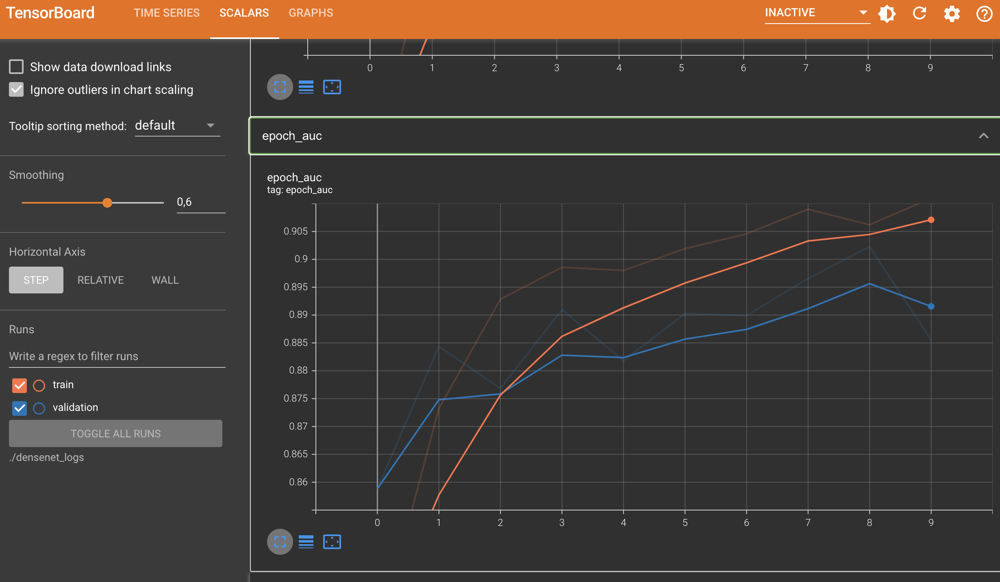

#### Test set evaluation

In [159]:
evaluate_model(inception, train_generator_augmented_weak)

10/10 [==============================] - 1s 97ms/step - loss: 0.4376 - accuracy: 0.8625 - f1: 0.8613 - auc: 0.8709
Train Loss:  0.27137142419815063
Train Accuracy:  0.90625
--------------------
Valid Loss:  0.561100423336029
Valid Accuracy:  0.8375000357627869
--------------------
Test Loss:  0.437628835439682
Test Accuracy:  0.862500011920929


1/1 [==============================] - 1s 709ms/step


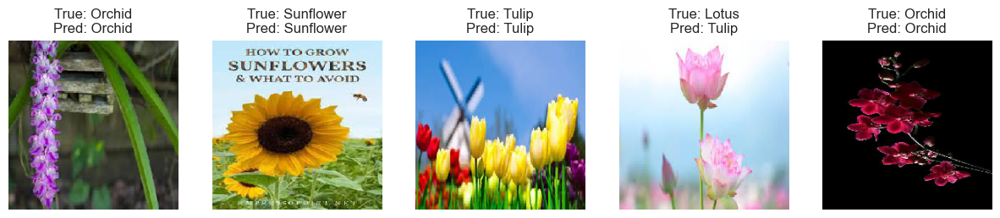

In [160]:
show_predictions(inception, test_generator, test_generator.class_indices)